$$ ITI \space AI-Pro: \space Intake \space 45 $$
$$ Deep \space Learning $$
$$ Lab \space no. \space 4 $$

# `01` Assignment 01
- Design your own U-Net to segment the lung fields from chest computed tomography CT images (download from [here](https://drive.google.com/file/d/1-CLX2Pj1OYyOgDoLkSBJA-js75CpGdg9/view?usp=sharing)) into one of the 2 classes lung or chest (background)
- Image Size: $512\times512\times1$
- Use a generator to load the images
(**Hint:** You can use `tensorflow.keras.utils.image_dataset_from_directory`)
- Use 85% of the provided data for training and 15% for validation.
- Use $32 → 64 → 128 → 256 → 512 → 256 → 128 → 64 → 32$ architecture.
- Use $3\times3$ **Convolution**, $2\times2$ **MaxPooling**
- Use `binary_crossentropy` for the loss calculation, `Adam` for optimization and `accuracy` for metrics.

## `+` Import Libraries

In [51]:
import gdown
from tensorflow.keras.applications import VGG16

# `+` Seed Value

In [2]:
SEED = 907
BATCH_SIZE = 8
EPOCHS = 50

## `+` Downlaod, Load & Preprocess Chest CT Data

In [3]:
import gdown

file_id = "1-CLX2Pj1OYyOgDoLkSBJA-js75CpGdg9"
url = f"https://drive.google.com/uc?id={file_id}"

gdown.download(url, output="lung.zip", quiet=False)


Downloading...
From (original): https://drive.google.com/uc?id=1-CLX2Pj1OYyOgDoLkSBJA-js75CpGdg9
From (redirected): https://drive.google.com/uc?id=1-CLX2Pj1OYyOgDoLkSBJA-js75CpGdg9&confirm=t&uuid=eed13a79-9ceb-4de4-ab55-21bf4c7d1678
To: /content/lung.zip
100%|██████████| 41.1M/41.1M [00:00<00:00, 158MB/s]


'lung.zip'

### Download & Extract the Dataset

In [4]:
%%capture
!unzip lung.zip

### Load & Preprocess the Dataset

**Reminder:** You might need rescaling, data augmentation, and/or other preprocessing methods.

In [5]:
import os
from glob import glob
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.utils import image_dataset_from_directory

In [6]:
folders = ['grey', 'mask']
for folder in folders:
    out_dir = f'Lung_Data_PNG/{folder}'
    os.makedirs(out_dir, exist_ok=True)
    for img in glob(f'Lung_Data/{folder}/*.bmp'):
        Image.open(img).save(os.path.join(out_dir, img.split('/')[-1].rsplit('.', maxsplit=1)[0] + '.png'), 'PNG')

In [52]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import RandomRotation, RandomFlip, RandomZoom,Rescaling
def create_augmentation_pipeline():
    return tf.keras.Sequential([
        RandomFlip("horizontal"),
        RandomRotation(0.2),
        RandomZoom(0.2)
    ])
augmenter = create_augmentation_pipeline()


In [7]:
def augment_image(image):
    image = augmenter(image)
    return image

In [9]:
# Image Dataset
grey_train_ds, grey_val_ds = image_dataset_from_directory('Lung_Data_PNG/grey',
                                                batch_size=BATCH_SIZE,
                                                seed=SEED,
                                                image_size=(512, 512),
                                                color_mode="grayscale",
                                                labels=None,
                                                validation_split=0.15,
                                                subset="both")

Found 216 files.
Using 184 files for training.
Using 32 files for validation.


In [10]:
# label Dataset
mask_train_ds, mask_val_ds = image_dataset_from_directory('Lung_Data_PNG/mask',
                                                batch_size=BATCH_SIZE,
                                                seed=SEED,
                                                image_size=(512, 512),
                                                color_mode="grayscale",
                                                labels=None,
                                                validation_split=0.15,
                                                subset="both")

Found 216 files.
Using 184 files for training.
Using 32 files for validation.


In [11]:
print(f"Grey Dataset: {grey_train_ds.element_spec}")
print(f"Mask Dataset: {mask_train_ds.element_spec}")

Grey Dataset: TensorSpec(shape=(None, 512, 512, 1), dtype=tf.float32, name=None)
Mask Dataset: TensorSpec(shape=(None, 512, 512, 1), dtype=tf.float32, name=None)


In [12]:
train_ds = tf.data.Dataset.zip((grey_train_ds, mask_train_ds))


In [13]:
val_ds=tf.data.Dataset.zip((grey_val_ds, mask_val_ds))

### Preview the Images

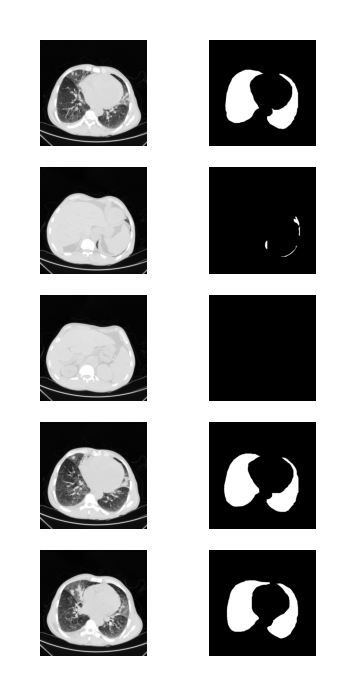

In [14]:
# Preview Images
plt.figure(figsize=(1, 2), dpi=400)
for images, masks in train_ds:
    for i in range(5):
        plt.subplot(5, 2, i*2+1)
        plt.imshow(images[i], cmap='gray')
        plt.axis('off')
        plt.subplot(5, 2, i*2+2)
        plt.imshow(masks[i], cmap='gray')
        plt.axis('off')

## `+` Set Global Parameters

In [15]:
# Hyperparameters
BATCH_SIZE  =8
EPOCHS      =50

## `i` Model Design

In [16]:
for images, masks in train_ds:
    print(images.shape)
    print(masks.shape)
    break

(8, 512, 512, 1)
(8, 512, 512, 1)


In [17]:
input_shape=(512, 512, 1)


In [18]:
def double_conv(x, n_filters):
    x = Conv2D(n_filters, 3,padding = "same", kernel_initializer = "he_normal")(x)
    x = Activation("relu")(x)
    x = Conv2D(n_filters, 3, padding = "same", kernel_initializer = "he_normal")(x)
    x = Activation("relu")(x)
    return x

In [19]:
def DownSample(x, n_filters):
  f= double_conv(x, n_filters)
  p = MaxPool2D((2, 2))(f)
  return f, p

In [20]:
def UpSample(x,f,n_filters):
  out=Conv2DTranspose(n_filters, (3, 3), strides=(2, 2), padding="same")(x)
  out = Concatenate()([out, f])
  out = double_conv(out, n_filters)
  return out


In [21]:
inputs = Input((512, 512, 1))
s1, p1 = DownSample(inputs, 8)
s2, p2 = DownSample(p1, 16)
s3, p3 = DownSample(p2, 32)
s4, p4 = DownSample(p3, 64)
bottleneck = double_conv(p4, 128)
u1=UpSample(bottleneck,s4,64)
u2=UpSample(u1,s3,32)
u3=UpSample(u2,s2,16)
u4=UpSample(u3,s1,8)
outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(u4)
model=Model(inputs,outputs,name="U_net")
model.summary()

Model: "U_net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 512, 512,  │         80 │ input_layer[0][0] │
│                     │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 512, 512,  │          0 │ conv2d[0][0]      │
│ (Activation)        │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 512, 512,  │        584 │ activation[0][0]  │
│                     │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 512, 512,  │          0 │ conv2d_1[0][0]    │
│ (Activation)        │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 256, 256,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │      1,168 │ max_pooling2d[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 256, 256,  │          0 │ conv2d_2[0][0]    │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │      2,320 │ activation_2[0][… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 256, 256,  │          0 │ conv2d_3[0][0]    │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 128, 128,  │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │      4,640 │ max_pooling2d_1[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 128, 128,  │          0 │ conv2d_4[0][0]    │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 128, 128,  │      9,248 │ activation_4[0][… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_5        │ (None, 128, 128,  │          0 │ conv2d_5[0][0]    │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 64, 64,    │          0 │ activation_5[0][… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 64, 64,    │     18,496 │ max_pooling2d_2[

 Total params: 540,073 (2.06 MB)

 Trainable params: 540,073 (2.06 MB)

 Non-trainable params: 0 (0.00 B)

## `ii` Model Compilation & Training

In [22]:
def rescale_image_and_label(image, label):
    image = tf.cast(image, tf.float32) / 255.0
    label = tf.cast(label, tf.float32) / 255.0
    return image, label
train_ds = train_ds.map(rescale_image_and_label)
val_ds = val_ds.map(rescale_image_and_label)


In [23]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [17]:
from tensorflow.keras.callbacks import EarlyStopping
earlystop_cb = EarlyStopping(
    monitor='val_loss',
    patience=5,
    verbose=1
)


In [25]:
history=model.fit(
    x=train_ds,
    epochs=33,
    callbacks=[earlystop_cb],
    validation_data=val_ds
)

Epoch 1/33
23/23 ━━━━━━━━━━━━━━━━━━━━ 27s 296ms/step - accuracy: 0.7836 - loss: 0.5526 - val_accuracy: 0.8831 - val_loss: 0.3504
Epoch 2/33
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.8940 - loss: 0.2941 - val_accuracy: 0.8835 - val_loss: 0.2290
Epoch 3/33
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - accuracy: 0.8903 - loss: 0.2173 - val_accuracy: 0.8834 - val_loss: 0.2142
Epoch 4/33
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.8903 - loss: 0.1906 - val_accuracy: 0.8887 - val_loss: 0.1669
Epoch 5/33
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 134ms/step - accuracy: 0.9118 - loss: 0.1372 - val_accuracy: 0.9535 - val_loss: 0.0970
Epoch 6/33
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - accuracy: 0.9526 - loss: 0.1042 - val_accuracy: 0.9686 - val_loss: 0.0670
Epoch 7/33
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 134ms/step - accuracy: 0.9741 - loss: 0.0609 - val_accuracy: 0.9876 - val_loss: 0.0375
Epoch 8/33
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - accuracy: 0.9866 - loss: 0.0391 - val_accuracy: 0

## `iii` Model Evaluation

In [26]:
loss,acc=model.evaluate(val_ds)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9934 - loss: 0.0170


In [27]:
print(f"Accuracy={acc:.2f}")
print(f"Loss={loss:.2f}")


Accuracy=0.99
Loss=0.02


## `iv` Result Visualization

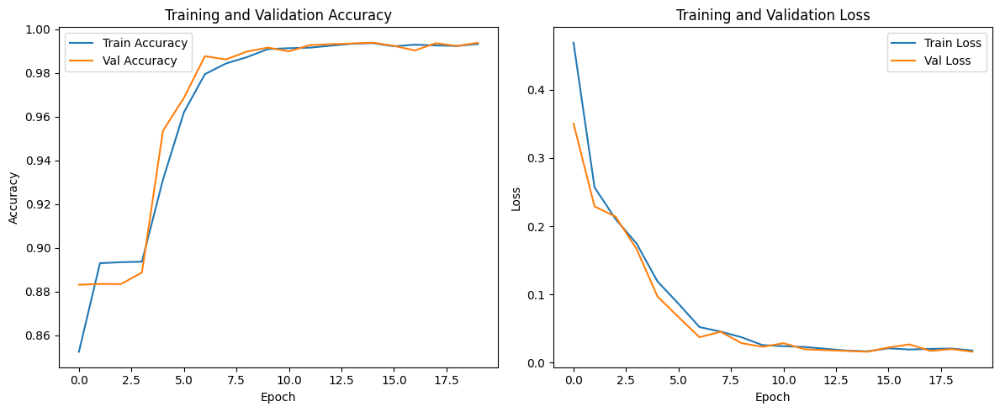

In [28]:
# Plot the training and validation accuracy and loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


plt.tight_layout()
plt.show()

## `v` It's Time for Segmentation!!

Let's try to predict the mask of some validation samples and plot the results.

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


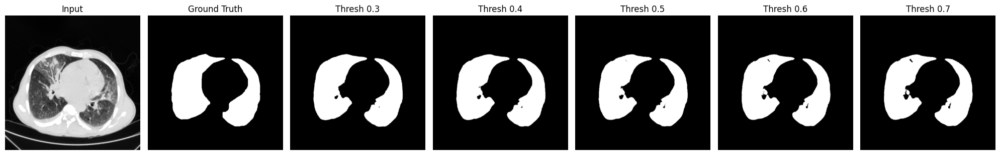

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


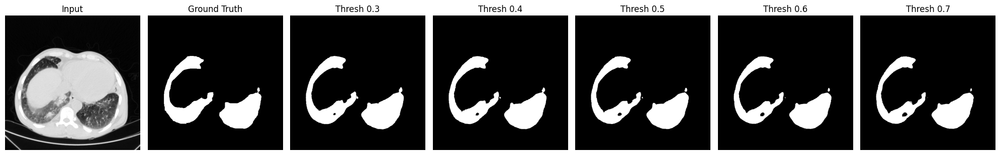

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


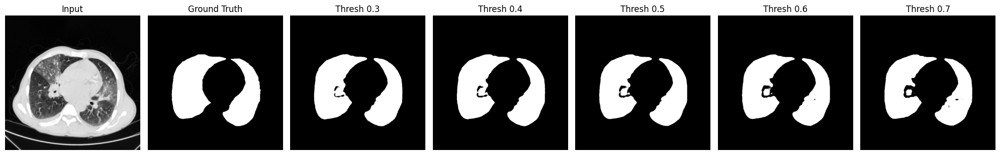

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


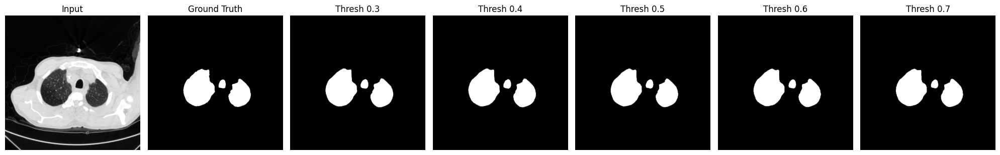

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


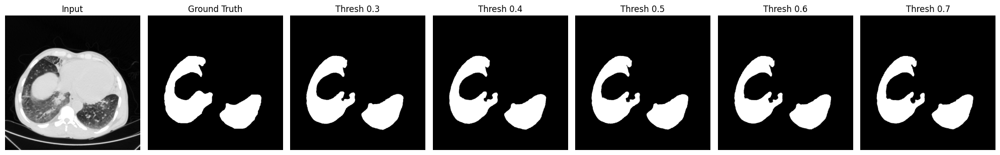

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


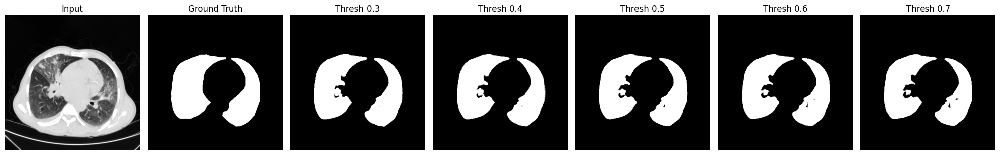

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


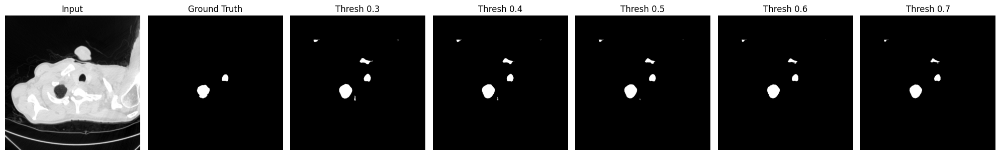

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


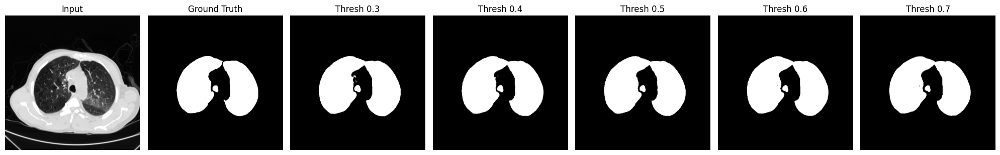

In [29]:
import matplotlib.pyplot as plt
import tensorflow as tf
for images, masks in val_ds.take(1):
    num_images_to_show = 8
    thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]

    for i in range(num_images_to_show):
        image = images[i]
        true_mask = masks[i]

        # Expand dimension for prediction
        input_image = tf.expand_dims(image, axis=0)

        # Predict mask
        pred_mask = model.predict(input_image)[0]


        plt.figure(figsize=(20, 4))

        # Plot the input image
        plt.subplot(1, 7, 1)
        plt.imshow(tf.squeeze(image), cmap='gray')
        plt.title('Input')
        plt.axis('off')

        # Plot the ground truth mask
        plt.subplot(1, 7, 2)
        plt.imshow(tf.squeeze(true_mask), cmap='gray')
        plt.title('Ground Truth')
        plt.axis('off')

        # Loop through thresholds and plot predicted masks
        for idx, threshold in enumerate(thresholds):
            pred_mask_binary = tf.where(pred_mask > threshold, 1.0, 0.0)

            plt.subplot(1, 7, 3 + idx)
            plt.imshow(tf.squeeze(pred_mask_binary), cmap='gray')
            plt.title(f'Thresh {threshold}')
            plt.axis('off')

        plt.tight_layout()
        plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


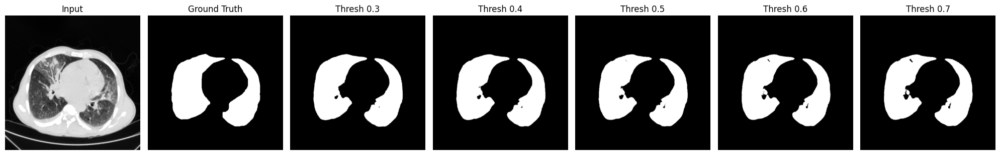

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


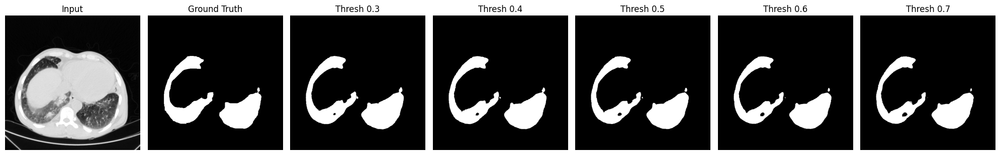

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


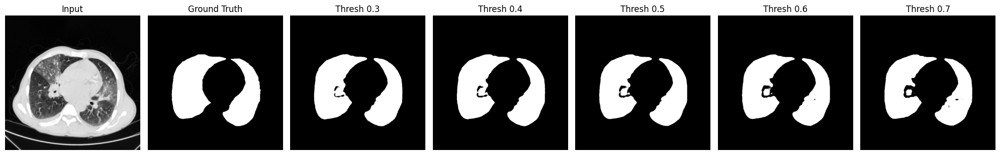

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


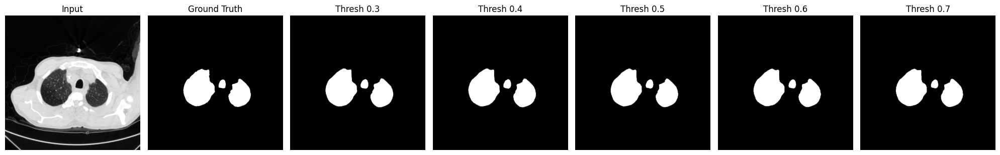

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


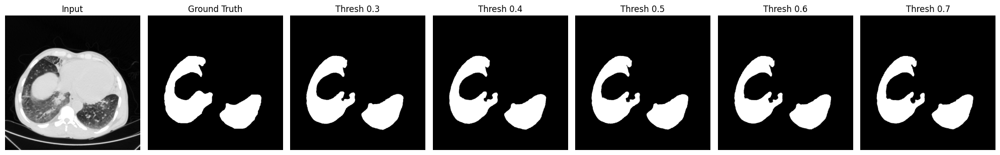

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


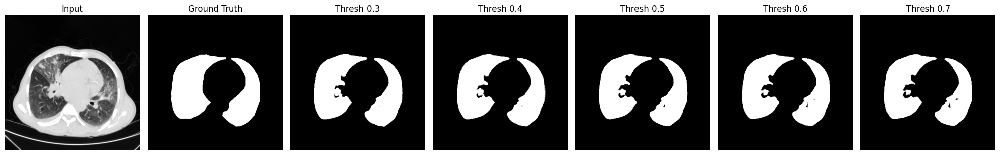

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


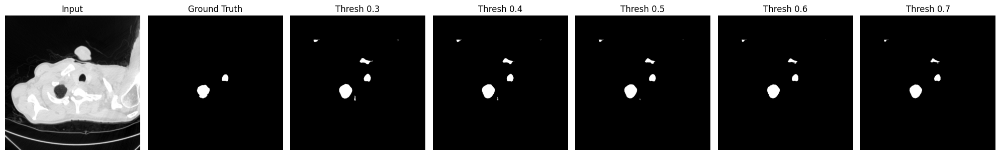

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


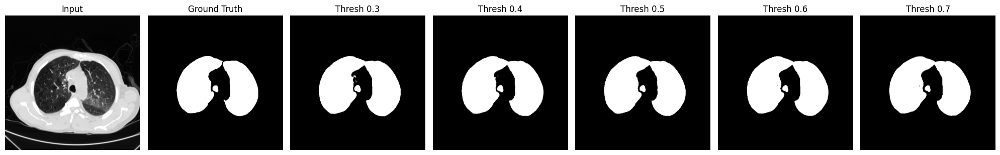

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


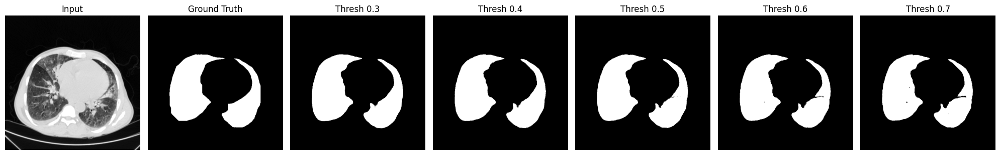

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


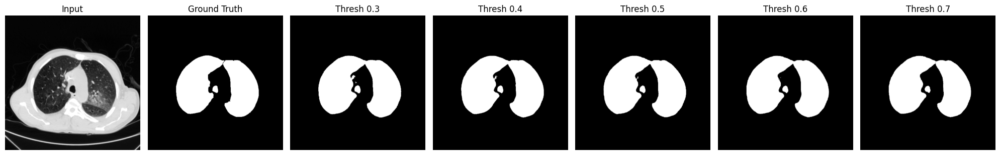

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


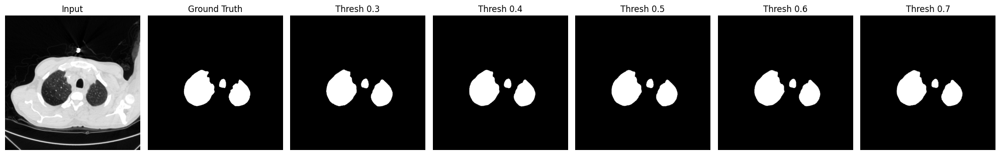

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


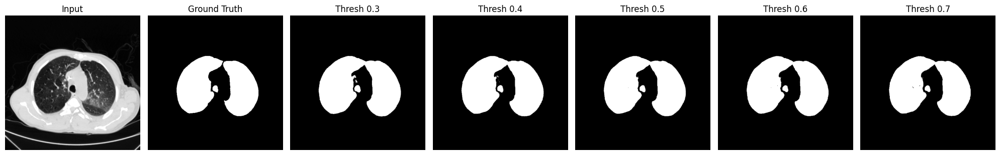

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


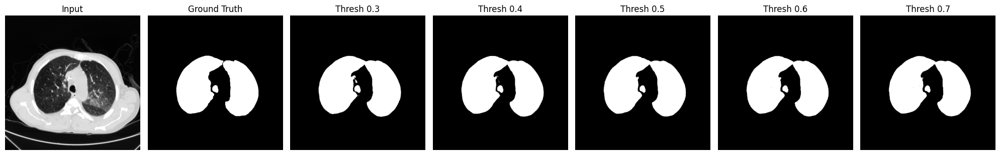

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


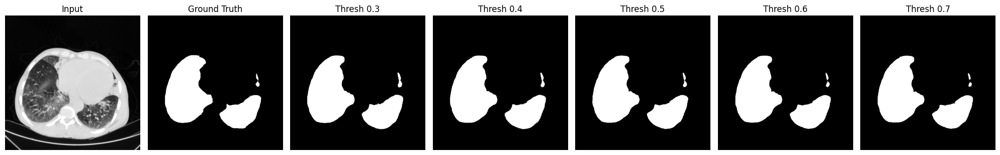

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


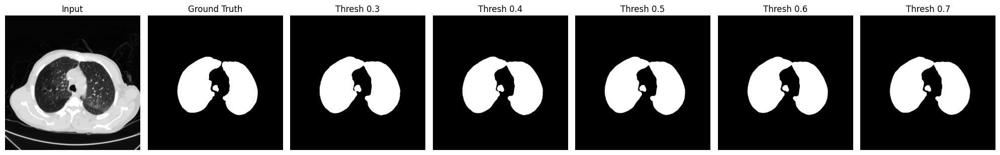

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


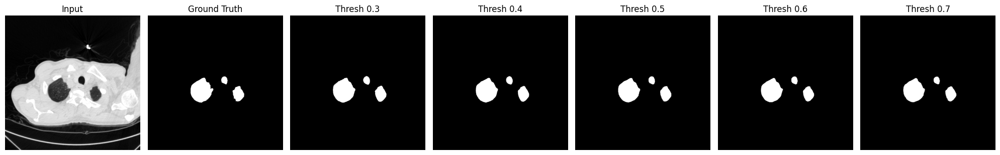

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


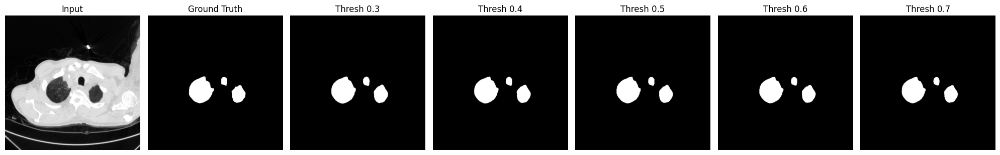

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


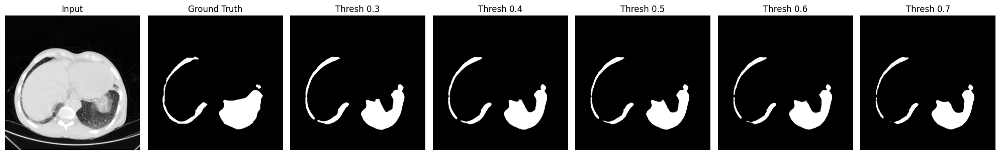

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


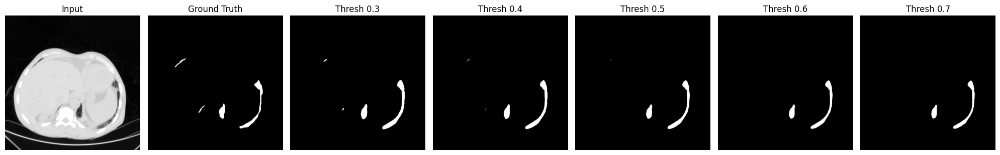

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


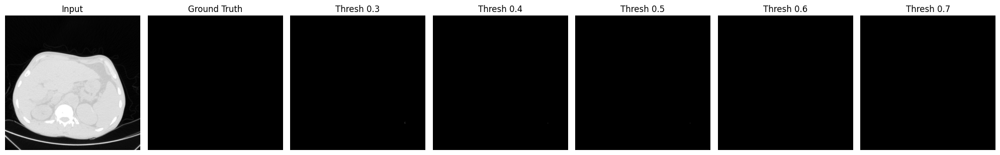

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


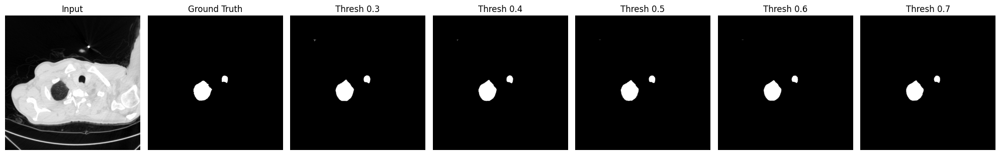

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


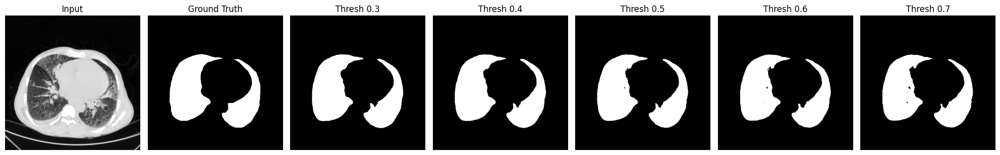

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


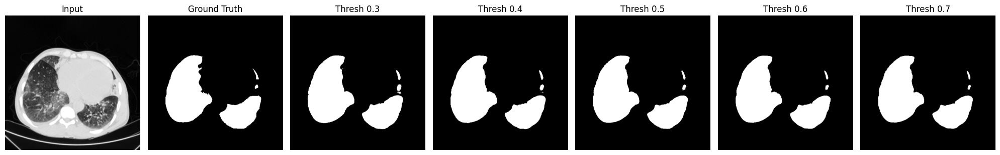

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


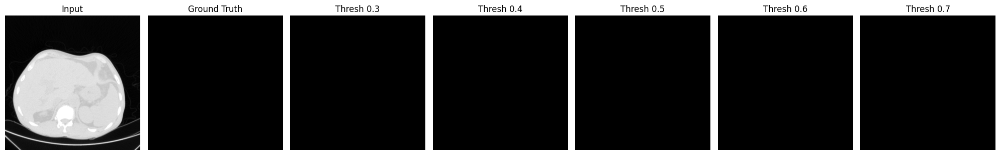

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


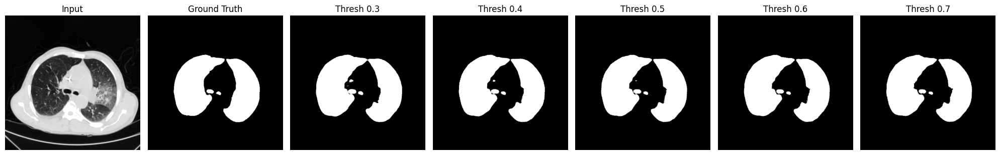

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


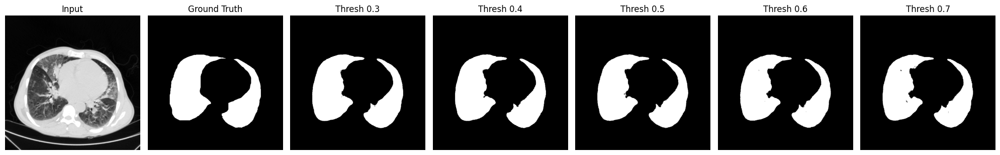

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


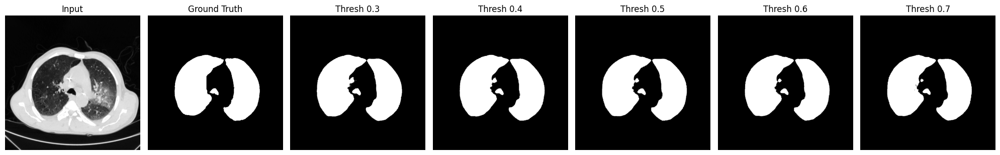

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


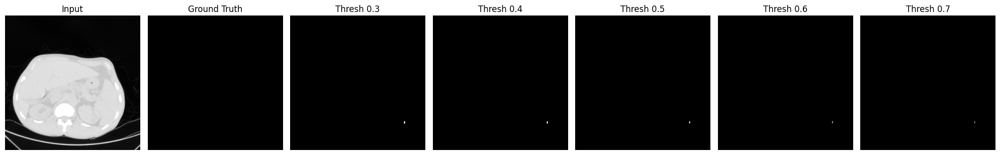

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


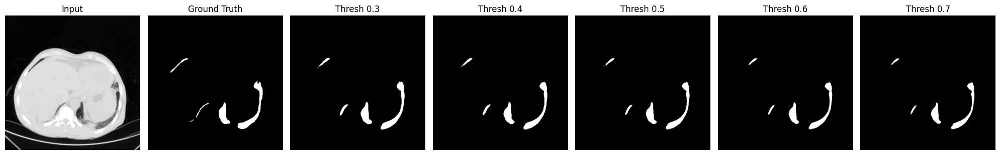

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


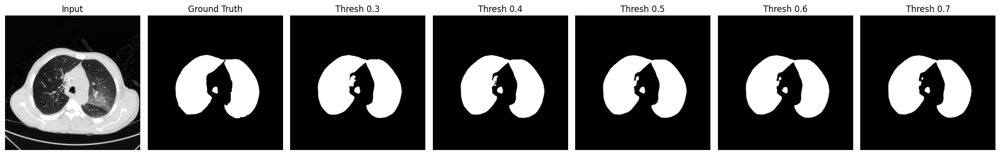

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


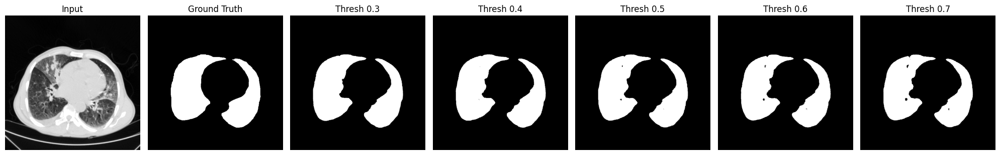

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


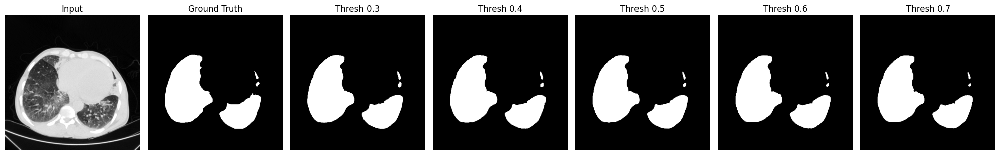

In [31]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Take one batch from the validation dataset
for images, masks in val_ds.take(5):
    num_images_to_show = 8  # Number of images to display
    thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]  # Different thresholds to test

    for i in range(num_images_to_show):
        image = images[i]
        true_mask = masks[i]

        # Expand dimension for prediction
        input_image = tf.expand_dims(image, axis=0)

        # Predict mask
        pred_mask = model.predict(input_image)[0]

        # Set a larger figure size for a wide single-row layout
        plt.figure(figsize=(20, 4))  # Width x Height

        # Plot the input image
        plt.subplot(1, 7, 1)
        plt.imshow(tf.squeeze(image), cmap='gray')
        plt.title('Input')
        plt.axis('off')

        # Plot the ground truth mask
        plt.subplot(1, 7, 2)
        plt.imshow(tf.squeeze(true_mask), cmap='gray')
        plt.title('Ground Truth')
        plt.axis('off')

        # Loop through thresholds and plot predicted masks
        for idx, threshold in enumerate(thresholds):
            pred_mask_binary = tf.where(pred_mask > threshold, 1.0, 0.0)

            plt.subplot(1, 7, 3 + idx)
            plt.imshow(tf.squeeze(pred_mask_binary), cmap='gray')
            plt.title(f'Thresh {threshold}')
            plt.axis('off')

        plt.tight_layout()
        plt.show()


In [30]:
model.save('model.h5')


**Note:** You can add more trials and explore different hyperparameters and design decisions as you want.

------------------------------

# Assignment 02
- Design your Deep Convolutional Neural Network using `Transfer Learning`
- You can select any pretrained model as a base and build on top.
- The task is to successfully classify images of cats and dogs using the dataset [here](https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip).
- There are no constraint; you have **full power**.

## `+` Downlaod, Load & Preprocess Cats & Dogs Data

### Download & Extract the Dataset

In [1]:
!curl -O https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  786M  100  786M    0     0   138M      0  0:00:05  0:00:05 --:--:--  143M


In [2]:
!unzip -q kagglecatsanddogs_5340.zip
!ls -Rd PetImages/*

PetImages/Cat  PetImages/Dog


In [8]:
# Delete Corrupted Images

num_skipped = 0
for folder_name in ("Cat", "Dog"):
    folder_path = os.path.join("/kaggle/working/PetImages", folder_name)
    for fname in os.listdir(folder_path):
        fpath = os.path.join(folder_path, fname)
        try:
            fobj = open(fpath, "rb")
            is_jfif = b"JFIF" in fobj.peek(10)
        finally:
            fobj.close()

        if not is_jfif:
            num_skipped += 1
            # Delete corrupted image
            os.remove(fpath)

print(f"Deleted {num_skipped} images.")

Deleted 1590 images.


### Load & Preprocess the Dataset

**Reminder:** You might need rescaling, data augmentation, and/or other preprocessing methods.

In [29]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='PIL')


In [30]:
from PIL import Image
import os

def clean_jpeg_images(folder_path):
    for root, _, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(".jpg") or file.lower().endswith(".jpeg"):
                img_path = os.path.join(root, file)
                try:
                    img = Image.open(img_path)
                    img.save(img_path, "JPEG")  # Re-save the image
                except Exception as e:
                    print(f"Failed to fix {img_path}: {e}")

# Example usage
clean_jpeg_images('/kaggle/working/PetImages/Cat')


In [31]:
from PIL import Image
import os

def clean_jpeg_images(folder_path):
    for root, _, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(".jpg") or file.lower().endswith(".jpeg"):
                img_path = os.path.join(root, file)
                try:
                    img = Image.open(img_path)
                    img.save(img_path, "JPEG")  # Re-save the image
                except Exception as e:
                    print(f"Failed to fix {img_path}: {e}")

# Example usage
clean_jpeg_images('/kaggle/working/PetImages/Dog')


In [34]:
import os
from PIL import Image

def find_corrupted_images(main_folder):
    bad_files = []
    categories = ['Cat', 'Dog']

    for category in categories:
        folder_path = os.path.join(main_folder, category)
        for root, _, files in os.walk(folder_path):
            for file in files:
                if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                    img_path = os.path.join(root, file)
                    try:
                        img = Image.open(img_path)
                        img.verify()  # Check for corruption
                    except Exception as e:
                        bad_files.append(img_path)
                        print(f"❌ Corrupt image: {img_path} | Error: {e}")

    return bad_files

# Replace this with your actual dataset path
dataset_folder = "/kaggle/working/PetImages" 
corrupted_images = find_corrupted_images(dataset_folder)

print(f"\nTotal corrupted images: {len(corrupted_images)}")




Total corrupted images: 0


In [35]:
# Training/Validation Dataset
train_ds,val_ds = image_dataset_from_directory(
    '/kaggle/working/PetImages',
    image_size=(180, 180),
    batch_size=32,
    label_mode='int',
    seed=123,
    validation_split=0.2,
    subset="both"
)

Found 23410 files belonging to 2 classes.
Using 18728 files for training.
Using 4682 files for validation.


In [36]:
train_ds = train_ds.map(lambda x, y: (augment_image(x), y))


### Preview the Images

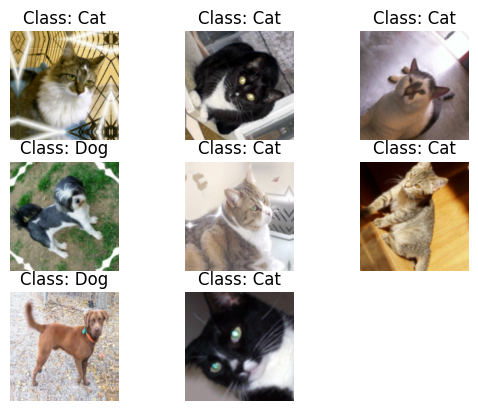

In [11]:
# Preview Images
for images, labels in train_ds.take(2):
  for i in range(8):
    plt.subplot(3, 3, i+1)
    plt.imshow(np.array(images[i]).astype('uint8'))
    plt.title(f'Class: {["Cat", "Dog"][labels[i]]}')
    plt.axis('off')

## `+` Set Global Parameters

In [37]:
# Hyperparameters
BATCH_SIZE  =32
EPOCHS      =20

## `i` Model Design

In [53]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models

base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(180, 180, 3))
base_model.trainable = False

/tmp/ipykernel_31/3231915532.py:4: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(180, 180, 3))


## `ii` Model Compilation & Training

In [39]:
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dense(2, activation='softmax')  
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [42]:
train_ds = train_ds.map(lambda x, y: (x / 255.0, y))
val_ds = val_ds.map(lambda x, y: (x / 255.0, y))


## `iii` Model Evaluation

In [43]:
history=model.fit(train_ds,batch_size=32,epochs=20,validation_data=val_ds,callbacks=[earlystop_cb])

Epoch 1/20
586/586 ━━━━━━━━━━━━━━━━━━━━ 126s 214ms/step - accuracy: 0.8966 - loss: 0.2402 - val_accuracy: 0.9799 - val_loss: 0.0608
Epoch 2/20
586/586 ━━━━━━━━━━━━━━━━━━━━ 128s 219ms/step - accuracy: 0.9377 - loss: 0.1500 - val_accuracy: 0.9808 - val_loss: 0.0591
Epoch 3/20
586/586 ━━━━━━━━━━━━━━━━━━━━ 128s 218ms/step - accuracy: 0.9383 - loss: 0.1472 - val_accuracy: 0.9769 - val_loss: 0.0621
Epoch 4/20
586/586 ━━━━━━━━━━━━━━━━━━━━ 127s 216ms/step - accuracy: 0.9459 - loss: 0.1298 - val_accuracy: 0.9818 - val_loss: 0.0521
Epoch 5/20
586/586 ━━━━━━━━━━━━━━━━━━━━ 129s 219ms/step - accuracy: 0.9459 - loss: 0.1316 - val_accuracy: 0.9757 - val_loss: 0.0637
Epoch 5: early stopping


## `iv` Result Visualization

In [44]:
loss,acc=model.evaluate(val_ds)
print(f"Accuracy={acc:.2f}")
print(f"Loss={loss:.2f}")


147/147 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.9753 - loss: 0.0679
Accuracy=0.98
Loss=0.06


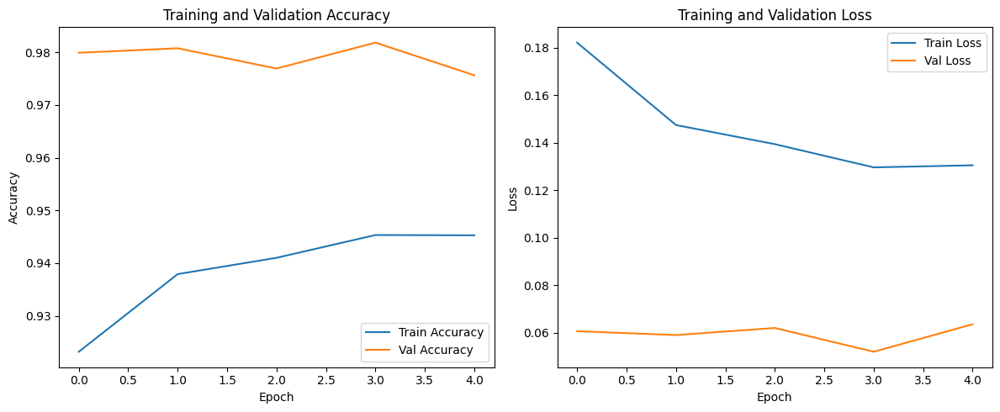

In [45]:
# Plot the training and validation accuracy and loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()


plt.tight_layout()
plt.show()

## `v` Let's Test Our Model

Let's try to predict the class of some validation samples and plot the results.

Also, try to classify an image from the internet.

**Note:** remember to properly process the image (dimensions, rescaling, etc.)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted labels: [1 0 0 1 0 0 0 0]
True labels     : [1 0 0 1 0 0 0 0]


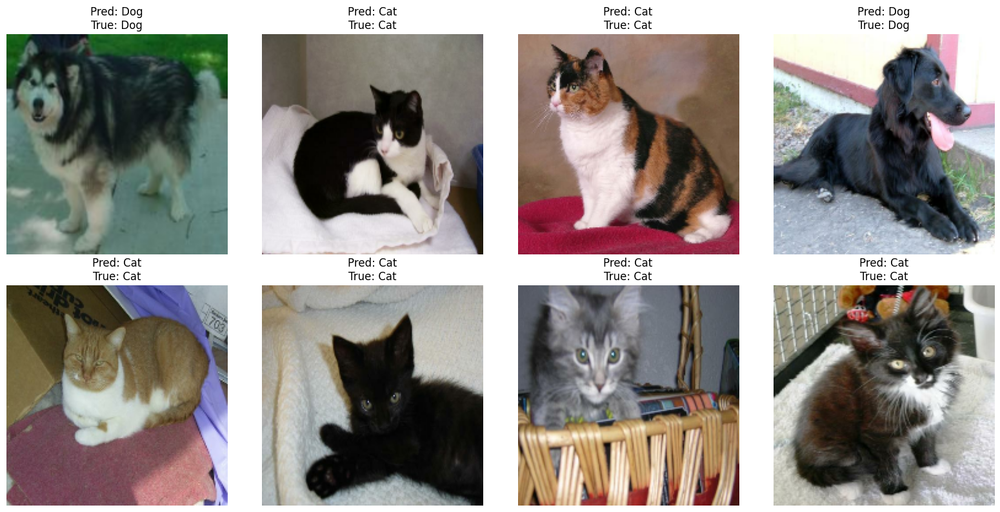

In [46]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Fetch one batch of images and labels
for images, labels in val_ds.take(1):
    num_images_to_show = 8  # Show 8 images

    # Predict the labels using Softmax activation
    predictions = model.predict(images[:num_images_to_show])
    predicted_labels = np.argmax(predictions, axis=1)

    # Print to inspect the predicted and true labels
    print("Predicted labels:", predicted_labels)
    print("True labels     :", labels[:num_images_to_show].numpy())

    # Plot in a 2x4 grid
    plt.figure(figsize=(16, 8))

    for i in range(num_images_to_show):
        image = images[i].numpy()
        true_label = labels[i].numpy()
        pred_label = predicted_labels[i]

        # Rescale if needed (assuming image was normalized to [0,1])
        if image.max() <= 1.0:
            image = (image * 255).astype("uint8")

        plt.subplot(2, 4, i + 1)
        plt.imshow(image)
        title = f"Pred: {'Cat' if pred_label == 0 else 'Dog'}\nTrue: {'Cat' if true_label == 0 else 'Dog'}"
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Predicted labels: [1 0 0 1 0 0 0 0]
True labels     : [1 0 0 1 0 0 0 0]


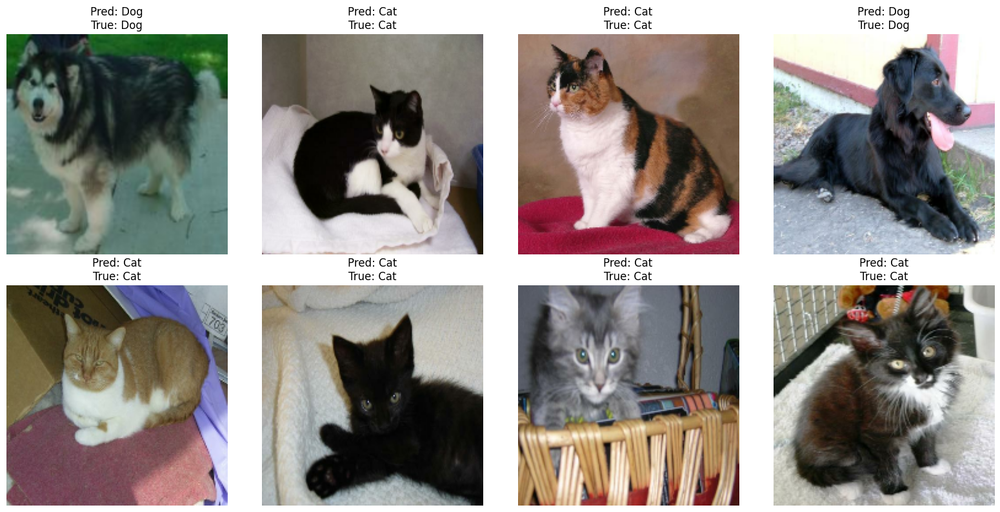

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predicted labels: [0 0 0 1 1 0 1 1]
True labels     : [0 0 0 1 0 0 1 1]


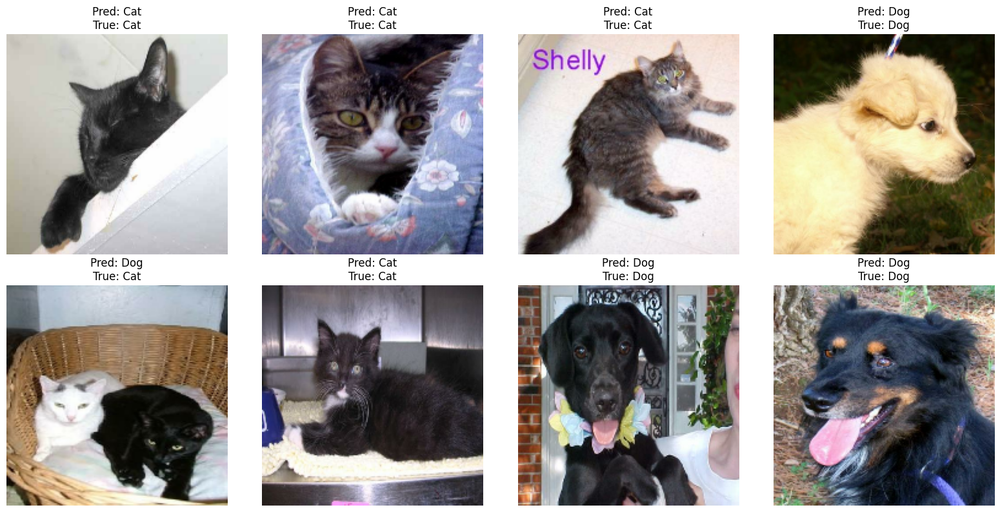

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Predicted labels: [0 0 1 0 0 1 0 0]
True labels     : [0 0 1 0 0 1 0 0]


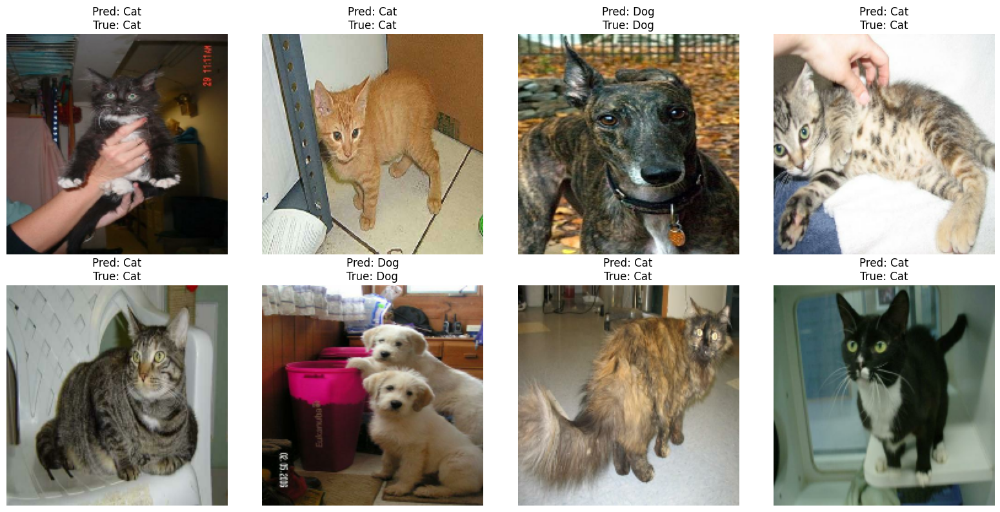

In [54]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Fetch one batch of images and labels
for images, labels in val_ds.take(3):
    num_images_to_show = 8  # Show 8 images

    # Predict the labels using Softmax activation
    predictions = model.predict(images[:num_images_to_show])
    predicted_labels = np.argmax(predictions, axis=1)

    # Print to inspect the predicted and true labels
    print("Predicted labels:", predicted_labels)
    print("True labels     :", labels[:num_images_to_show].numpy())

    # Plot in a 2x4 grid
    plt.figure(figsize=(16, 8))

    for i in range(num_images_to_show):
        image = images[i].numpy()
        true_label = labels[i].numpy()
        pred_label = predicted_labels[i]

        # Rescale if needed (assuming image was normalized to [0,1])
        if image.max() <= 1.0:
            image = (image * 255).astype("uint8")

        plt.subplot(2, 4, i + 1)
        plt.imshow(image)
        title = f"Pred: {'Cat' if pred_label == 0 else 'Dog'}\nTrue: {'Cat' if true_label == 0 else 'Dog'}"
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


# Test On Images From Internet

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


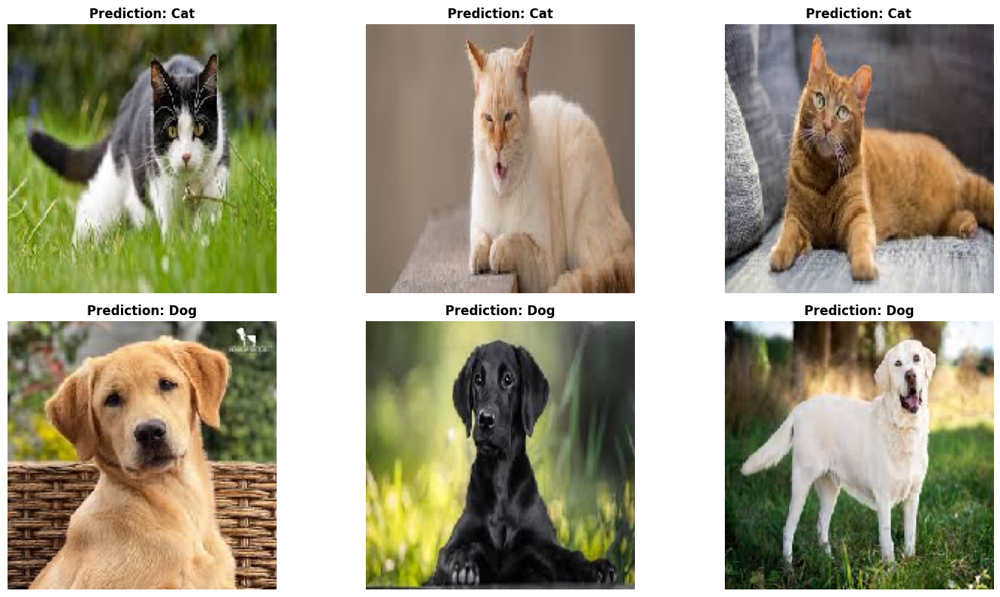

In [50]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model



# Path to test folder
test_folder = '/kaggle/input/test-animal/Animals'

# Get image file names
image_files = sorted([f for f in os.listdir(test_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])[:6]

# Initialize the plot
plt.figure(figsize=(15, 8))

# Loop through the first 6 test images
for i, file in enumerate(image_files):
    img_path = os.path.join(test_folder, file)
    

    img = image.load_img(img_path, target_size=(180,180,3))
    img_array = image.img_to_array(img)
    img_array = img_array / 255.0  
    img_array = np.expand_dims(img_array, axis=0)  

    # Predict
    pred = model.predict(img_array)
    pred_label = np.argmax(pred, axis=1)[0]  
    if pred_label==0:
        pred_label="Cat"
    else:
        pred_label="Dog"
    # Plot the image
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(f'Prediction: {pred_label}', fontsize=12, fontweight='bold')
    plt.axis('off')

plt.tight_layout()
plt.show()


----------------------------------------------

$$ Wish \space you \space all \space the \space best \space ♡ $$
$$ Abdelrahman \space Eid $$